In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from numpy import where

In [8]:
data1=pd.read_csv('working 3G.csv')

In [20]:
data=pd.read_csv('refused.csv')

In [26]:
df_11.columns

Index(['RNC', 'ENodeB', 'CellName', 'RRC_Attempt_Congestion_Ratio',
       'cluster_num', 'Date', 'Cell ID', 'Integrity',
       'VS.RRC.FailConnEstab.Cong', 'VS.RRC.AttConnEstab.EFACH',
       'VS.RRC.AttConnEstab.Service.Cell', 'VS.RRC.AttConnEstab.CellDCH',
       'VS.RRC.AttConnEstab.CellFACH', 'VS.RRC.AttConnEstab.ERACH',
       'VS.RAC.NewCallAcc', 'VS.RAC.NewCallReq', 'VS.RAB.Loss.CS(number)',
       'VS.RAB.Loss.PS(number)', 'VS.RAB.Loss.CS.RF.Oth',
       'VS.RAB.Loss.CS.RF.RLCRst', 'VS.RAB.Loss.PS.RF.Oth',
       'VS.RAB.Loss.PS.RF.RLCRst', 'VS.LCC.OLC.DL.Num', 'VS.LCC.OLC.UL.Num',
       'VS.RRC.Rej.ULCE.Cong', 'VS.RAC.NewCallReq.Fail.DLCE.Cong',
       'VS.RAC.NewCallReq.Fail.ULCE.Cong', 'VS.RRC.Rej.DLCE.Cong',
       'VS.RAB.FailEstabCS.DLCE.Cong', 'VS.RAB.FailEstabCS.ULCE.Cong',
       'VS.RAB.FailEstabPS.DLCE.Cong', 'VS.RAB.FailEstabPS.ULCE.Cong',
       'VS.RAC.SHO.Fail.ULCE.Cong', 'VS.RAC.SHO.Fail.DLCE.Cong',
       'VS.RAC.HHO.Fail.DLCE.Cong', 'VS.RAC.HHO.Fail.ULCE.Co

In [17]:
#data1.drop('Call Admission Refused Ratio(Cell)', axis = 1, inplace = True)

In [21]:
df_11 = pd.merge(data1, data, on=['RNC', 'ENodeB', 'CellName'])

In [4]:
#print(list(data.columns)[45])
# print(list(data.columns)[12])
# print(list(data.columns)[9])

In [4]:
data.drop(['VS.RAB.Loss.PS.RF.RLCRst','VS.RAB.Loss.CS.RF.RLCRst', 'VS.RAB.Loss.PS.RF.Oth','VS.RAB.Loss.CS.RF.Oth'], axis = 1,inplace=True)

In [15]:
data.to_csv('data3G.csv',index=False, index_label=False)

In [4]:
##################--->c<------#############
data1=pd.read_csv('data3G.csv')

In [34]:
#data1.drop(data1.index[2261],inplace=True)

In [35]:
#data1.to_csv('data3G.csv',index=False, index_label=False)

In [6]:
new_data=pd.DataFrame()
RNC=[];ENodeB=[];cell_name=[];RRC_Attempt_Congestion_Ratio=[]

In [23]:
for i in range(0,len(data1)):
   if data1.iloc[i]['VS.RRC.FailConnEstab.Cong']== 0:
       RNC.append(data1.iloc[i]['RNC'])
       ENodeB.append(data1.iloc[i]['NodeB Name'])
       cell_name.append(data1.iloc[i]['Cell Name'])
       RRC_Attempt_Congestion_Ratio.append(0)
   else:
       v=(data1.iloc[i]['VS.RRC.FailConnEstab.Cong']/data1.iloc[i]['VS.RRC.AttConnEstab.CellDCH'])*100
       RNC.append(data1.iloc[i]['RNC'])
       ENodeB.append(data1.iloc[i]['NodeB Name'])
       cell_name.append(data1.iloc[i]['Cell Name'])
       RRC_Attempt_Congestion_Ratio.append(v)

In [24]:
new_data.insert(0, 'RNC', RNC, True)
new_data.insert(1, 'ENodeB', ENodeB, True)
new_data.insert(2, 'CellName',cell_name, True)
new_data.insert(3, 'RRC_Attempt_Congestion_Ratio', RRC_Attempt_Congestion_Ratio, True)


In [27]:
Data = {'x': new_data['CellName'].index.to_list(),'y':new_data['RRC_Attempt_Congestion_Ratio'].to_list()}
df = pd.DataFrame(Data,columns=['x','y'])

In [29]:
from sklearn.cluster import KMeans
wcss = []                    #within-cluster sum of square
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++')
    kmeans.fit(df)
    # inertia method returns wcss for that model
    wcss.append(kmeans.inertia_)

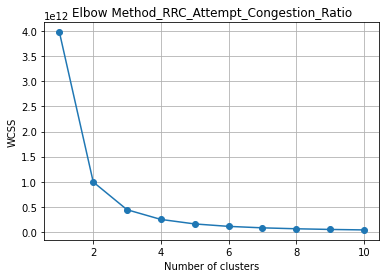

In [30]:
import matplotlib.pyplot as plt
number_of_clusters = range(1,11)
plt.plot(number_of_clusters, wcss, marker='o')
plt.title('Elbow Method_RRC_Attempt_Congestion_Ratio')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(axis='both')
plt.show()

In [28]:
yArr = df['y'].to_numpy()
centerData = len(df['y'])/2

[[1.07590145e-02]
 [6.82195248e+01]
 [9.84189212e+00]]


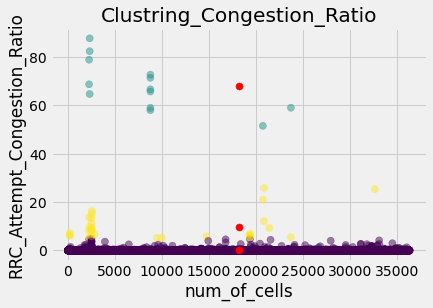

In [29]:
kmeans = KMeans(n_clusters=3).fit(yArr.reshape(-1, 1))
centroids = kmeans.cluster_centers_
new_data['cluster_num'] = pd.Series((kmeans.labels_)+1, index=new_data.index) 
print(centroids)
plt.style.use("fivethirtyeight")
plt.scatter(np.linspace(0,len(new_data['RRC_Attempt_Congestion_Ratio']),len(new_data['RRC_Attempt_Congestion_Ratio'])), new_data['RRC_Attempt_Congestion_Ratio'], c= kmeans.labels_.astype(float) ,s=50, alpha=0.5)
plt.scatter([centerData, centerData,centerData], centroids[:, 0], c='red', s=50)
plt.title('Clustring_Congestion_Ratio')
plt.xlabel('num_of_cells')
plt.ylabel('RRC_Attempt_Congestion_Ratio')
plt.show()

In [30]:
numbersElement = [] 
for i in range(kmeans.n_clusters):
    numbersElement.append(len(where(kmeans.labels_ == i)[0]))
numbersElement 

[36229, 13, 31]

In [9]:
new_data.columns

Index(['RNC', 'ENodeB', 'CellName', 'Call Admission Refused Ratio(Cell)',
       'RRC_Attempt_Congestion_Ratio', 'cluster_num(RRc_Congestion',
       'cluster_num'],
      dtype='object')

In [11]:
new_data.drop(['cluster_num(RRc_Congestion'], axis=1,inplace=True)

In [25]:
new_data.to_csv('working 3G.csv',index=False, index_label=False)

In [3]:
new_data=pd.read_csv('working 3G.csv')

In [23]:
#new_data.drop(new_data.index[2261],inplace=True)

In [44]:
Call_Admission_Refused_Ratio=[]
#######################------Call Admission Refused Ratio(Cell)---------#############
for i in range(0,len(data1)):
   if data1.iloc[i]['VS.RAC.NewCallAcc']== 0:
       Call_Admission_Refused_Ratio.append(0)
   else:
       v=1-(data1.iloc[i]['VS.RAC.NewCallAcc']/data1.iloc[i]['VS.RAC.NewCallReq'])*100
       Call_Admission_Refused_Ratio.append(v)      

In [45]:
new_data.insert(3, 'Call Admission Refused Ratio(Cell)', Call_Admission_Refused_Ratio, True)

In [4]:
print(list(data1.columns)[21])

VS.RRC.Rej.DLCE.Cong


In [7]:
new_data=pd.read_csv('working 3G.csv')

In [27]:
###########################################################################################
############################################################################################
def get_index (new_data):
    list1=[];list2=[]                     ## VS.RAC.DCCC.Fail.DLCE.Cong  VS.RAC.DCCC.Fail.ULCE.Cong
    for i in range(0,len(new_data)):
        if (new_data['cluster_num'][i]==2): #and (data1['VS.RAC.DCCC.Fail.DLCE.Cong'][i]>0)and (data1['VS.RAC.DCCC.Fail.ULCE.Cong'][i]>0):
            list1.append(i)
        if (new_data['cluster_num'][i]==3): #and (data1['VS.RAC.DCCC.Fail.DLCE.Cong'][i]>0) and (data1['VS.RAC.DCCC.Fail.ULCE.Cong'][i]>0): 
            list2.append(i)   
    return list1 ,list2

In [28]:
y,f=get_index(df_11)

In [ ]:
# plotting dataset
# plt.style.use("fivethirtyeight")        ####'Call Admission Refused Ratio'  'RRC_Attempt_Congestion_Ratio'
# plt.scatter(df_11['Call Admission Refused Ratio'],df_11['RRC_Attempt_Congestion_Ratio'],color = "green",edgecolors='darkgreen')

# for j,i in enumerate(y):
#     y2 = df_11.iloc[i]['RRC_Attempt_Congestion_Ratio']
#     x2 = df_11.iloc[i]['Call Admission Refused Ratio']
#     if j==0:
#         plt.scatter(x2, y2,color = "red",edgecolors='darkred',label='Call-Refused-in-cluster2')
#     else:
#         plt.scatter(x2, y2, color = "red", edgecolors='darkred') 

# for j,i in enumerate(f):
#     y2 = df_11.iloc[i]['RRC_Attempt_Congestion_Ratio']
#     x2 = df_11.iloc[i]['Call Admission Refused Ratio']
#     if j==0:
#         plt.scatter(x2, y2,color ='black',label='Call-Refused-in-cluster3')
#     else:
#         plt.scatter(x2, y2, color = "black") 

# plt.title("RRC-Congestion with Call-Refused")
# plt.ylabel("'RRC_Attempt_Congestion_Ratio %")
# plt.xlabel("'Call Admission Refused Rat %")
# plt.legend()
# plt.show()       

In [11]:
m=y+f

In [13]:
df2=pd.DataFrame()
x1=[];y1=[];cell=[];cluster=[];enodeB=[] ## VS.RAB.Loss.CS(number) VS.RAB.Loss.PS(number) 
                                          ## VS.RAC.DCCC.Fail.DLCE.Cong  VS.RAC.DCCC.Fail.ULCE.Cong
for i in (m):
    cell.append(data1.iloc[i]['Cell Name'])
    enodeB.append(new_data.iloc[i]['ENodeB'])
    x1.append(data1.iloc[i]['VS.RAC.DCCC.Fail.DLCE.Cong'])
    y1.append(data1.iloc[i]['VS.RAC.DCCC.Fail.ULCE.Cong'])
    cluster.append(new_data.iloc[i]['cluster_num'])
df2.insert(0, 'ENodeB', enodeB, True)        
df2.insert(1, 'Cell Name', cell, True)    
df2.insert(2, 'VS.RAC.DCCC.Fail.DLCE.Cong', x1, True)
df2.insert(3, 'VS.RAC.DCCC.Fail.ULCE.Cong', y1, True)
df2.insert(4, 'num_cluster', cluster, True)

In [14]:
df2.to_csv('DCCC_failure.csv',index=False, index_label=False)

In [27]:
#####################################
D1=pd.read_csv('ULblocking Rej.csv')
D2=pd.read_csv('DLblocking Rej.csv')

In [29]:
D1.columns

Index(['ENodeB', 'Cell Name', 'RRC_Attempt_Congestion_Ratio',
       'VS.RRC.Rej.ULCE.Cong', 'num_cluster'],
      dtype='object')

In [31]:
D3=D2.merge(D1, how = 'inner', on = ['ENodeB', 'Cell Name', 'RRC_Attempt_Congestion_Ratio','num_cluster'])

In [49]:
D3.to_csv('ULandDL_RRC_REJ.csv',index=False, index_label=False)

In [32]:
listUL=D3['VS.RRC.Rej.ULCE.Cong']
listDL=D3['VS.RRC.Rej.DLCE.Cong']

In [33]:
DF=pd.DataFrame()
DF.insert(0, 'VS.RRC.Rej.ULCE.Cong', listUL, True)        
DF.insert(1, 'VS.RRC.Rej.DLCE.Cong', listDL, True) 

In [13]:
ddf=df2.iloc[:,2:4]

In [14]:
from sklearn.cluster import KMeans
wcss = []                    #within-cluster sum of square
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++')
    kmeans.fit(ddf)
    # inertia method returns wcss for that model
    wcss.append(kmeans.inertia_)

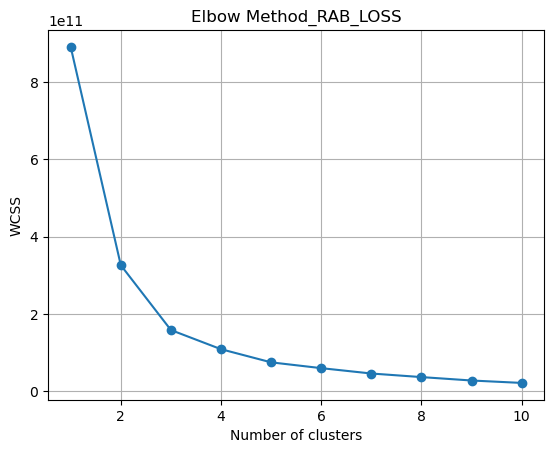

In [15]:
import matplotlib.pyplot as plt
plt.style.use('default')
number_of_clusters = range(1,11)
plt.plot(number_of_clusters, wcss, marker='o')
plt.title('Elbow Method_RAB_LOSS')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(axis='both')
plt.show()

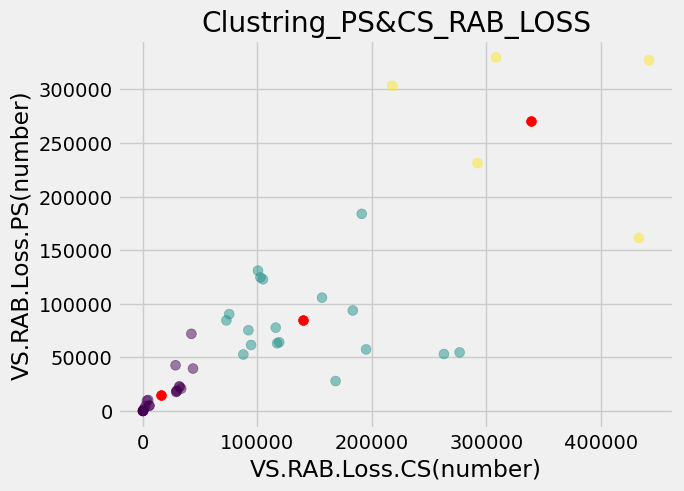

In [17]:
##clustring
kmeans = KMeans(n_clusters=3).fit(ddf)     #VS.RAB.Loss.CS(number) VS.RAB.Loss.PS(number)#
centroids = kmeans.cluster_centers_
df2['cluster_num'] = pd.Series((kmeans.labels_)+1, index=df2.index)

plt.style.use("fivethirtyeight")
plt.scatter(df2['VS.RAB.Loss.CS(number)'], df2['VS.RAB.Loss.PS(number)'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.title('Clustring_PS&CS_RAB_LOSS')
plt.xlabel('VS.RAB.Loss.CS(number)')
plt.ylabel('VS.RAB.Loss.PS(number)')
plt.show()

In [20]:
centroids = kmeans.cluster_centers_
for i in range(kmeans.n_clusters):
    print(centroids[i])
    

[15332.47619048 14814.42857143]
[139815.55555556  84623.77777778]
[338900.8 270573.8]


In [21]:
from numpy import where
num_Of_Values_in_Cluster = [] 
for i in range(kmeans.n_clusters):
    num_Of_Values_in_Cluster.append(len(where(kmeans.labels_ == i)[0]))
num_Of_Values_in_Cluster

[21, 18, 5]

In [4]:
############################################################################
###########################################################################
print(list(data1.columns)[22])
print(list(data1.columns)[23])
print(list(data1.columns)[24])
print(list(data1.columns)[25])

VS.RAB.FailEstabCS.DLCE.Cong
VS.RAB.FailEstabCS.ULCE.Cong
VS.RAB.FailEstabPS.DLCE.Cong
VS.RAB.FailEstabPS.ULCE.Cong


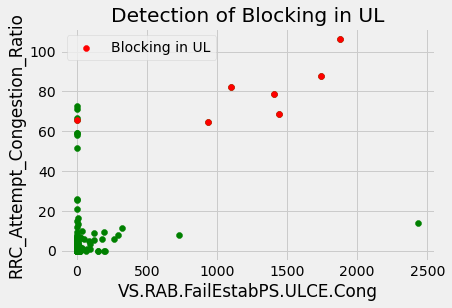

In [17]:
# plotting dataset
plt.style.use("fivethirtyeight")
plt.scatter(data1['VS.RAB.FailEstabPS.ULCE.Cong'],new_data['RRC_Attempt_Congestion_Ratio'],color = "green")

for j,i in enumerate(y):
    x2 = data1.iloc[i]['VS.RAB.FailEstabPS.ULCE.Cong']
    y2 = new_data.iloc[i]['RRC_Attempt_Congestion_Ratio']
    if j==0:
        plt.scatter(x2, y2,color = "red",label='Blocking in UL')
    else:
        plt.scatter(x2, y2, color = "red") 
plt.title("Detection of Blocking in UL")
plt.xlabel("VS.RAB.FailEstabPS.ULCE.Cong")
plt.ylabel("RRC_Attempt_Congestion_Ratio")
plt.legend()
plt.show()   

In [4]:
print(list(data1.columns)[14])
print(list(data1.columns)[15])

VS.RAB.Loss.CS(number)
VS.RAB.Loss.PS(number)
